In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
%cd /content/drive/MyDrive/FastAPI Demo

/content/drive/MyDrive/FastAPI Demo


In [ ]:
from glob import glob
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
import shutil
import yaml
from ultralytics import YOLO
from process.pre_process import resize_image, cut_unecessary_img

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/media/data3/users/nhatthang/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [32]:
images_dir = sorted(glob("datasets/images/*"))
masks_dir = sorted(glob("datasets/masks/*"))

In [33]:
def resize_image(image, value=0):
    height, width, _ = image.shape
    target_height = ((height + 255) // 256) * 256
    target_width = ((width + 255) // 256) * 256
    pad_height = max(0, target_height - height)
    pad_width = max(0, target_width - width)
    # Pad the image
    padded_image = cv2.copyMakeBorder(image, 0, pad_height, 0, pad_width, cv2.BORDER_CONSTANT, value=value)

    resized_image = padded_image[:target_height, :target_width, :]

    return resized_image

In [34]:
images_name = [os.path.basename(image).split('.')[0] for image in images_dir]

In [35]:
def split_image(image_name,image, output_dir, tile_size = 256):
    # Chia ảnh thành các phần nhỏ
    patches = []
    for i in range(0, image.shape[0], tile_size):
        for j in range(0, image.shape[1], tile_size):
            tile = image[i:i + tile_size, j:j + tile_size]
            cv2.imwrite(os.path.join(output_dir,f"{image_name}_{i}_{j}.png"), tile)
            patches.append(tile)
    return patches


In [36]:
images_data = []
masks_data = []
os.makedirs("datasets/images_split", exist_ok=True)
os.makedirs("datasets/masks_split", exist_ok=True)
for image_path, mask_path, img_n in zip(images_dir, masks_dir, images_name):
    image = cv2.imread(image_path)
    mask = cv2.imread(mask_path)
    image = resize_image(image)
    mask = resize_image(mask)
    images_data.extend(split_image(img_n, image, "datasets/images_split"))
    masks_data.extend(split_image(img_n, mask, "datasets/masks_split"))

In [37]:
print(len(images_data))
print(len(masks_data))

1168
1168


## Create YOLO format

In [38]:
images_path = sorted(glob("datasets/images_split/*"))
masks_path = sorted(glob("datasets/masks_split/*"))

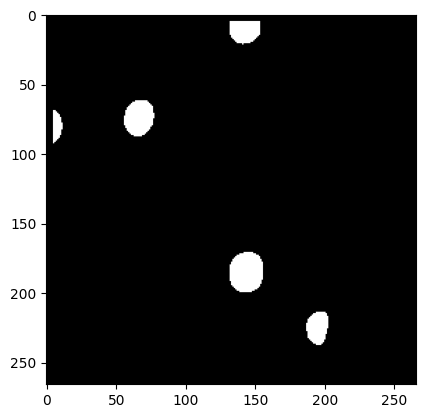

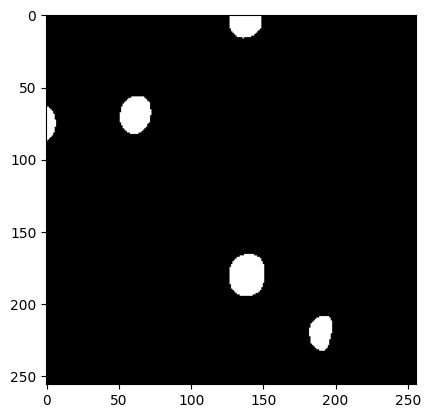

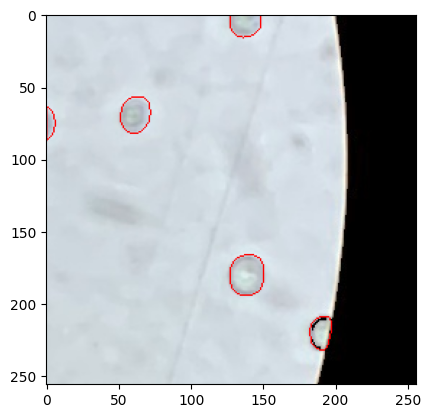

In [39]:
test_image = cv2.imread(images_path[191])
test_mask = cv2.imread(masks_path[191], cv2.IMREAD_GRAYSCALE)

test_mask = cv2.copyMakeBorder(test_mask, 5, 5, 5, 5, cv2.BORDER_CONSTANT, value=0)
plt.imshow(test_mask, cmap = "gray")
plt.show()
contours, _ = cv2.findContours(test_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)
    for i in range(len(contour)):
        contour[i][0][0] -= 5
        contour[i][0][1] -= 5
    cv2.drawContours(test_image, [contour], -1, (255, 0, 0), 1)
test_mask = test_mask[5:-5, 5:-5]
plt.imshow(test_mask, cmap = "gray")
plt.show()
plt.imshow(test_image)
plt.show()

In [71]:
def create_yolo_data(image_paths, mask_paths):
    yolo_data = []
    for image_path, mask_path in zip(image_paths, mask_paths):
        image = cv2.imread(image_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        padded_mask = cv2.copyMakeBorder(mask, 5, 5, 5, 5, cv2.BORDER_CONSTANT, value=0)

        contours, _ = cv2.findContours(padded_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

        yolo_labels = []
        for contour in contours:
            contour_data = []

            for point in contour:
                x, y = point[0]
                x = float(x - 5)
                y = float(y - 5)

                x = x / image.shape[1]
                y = y / image.shape[0]

                contour_data.append((x, y))

            class_id = 0
            yolo_label = f"{class_id} {' '.join(map(str, np.array(contour_data).flatten()))}\n"
            yolo_labels.append(yolo_label)

        yolo_data.append((image_path,yolo_labels))
        # with open(os.path.join(output_dir, f"{os.path.basename(image_path).split('.')[0]}.txt"), 'w') as f:
        #     f.writelines(yolo_labels)

    return yolo_data


In [72]:
images_path = sorted(glob("datasets/images_split/*"))
masks_path = sorted(glob("datasets/masks_split/*"))
yolo_data = create_yolo_data(images_path, masks_path)

In [73]:
yolo_data

[('datasets/images_split/10__0_0.png',
  ['0 0.6640625 0.9921875 0.66015625 0.99609375 0.6640625 0.99609375 0.66796875 0.99609375 0.671875 0.99609375 0.67578125 0.99609375 0.6796875 0.99609375 0.68359375 0.99609375 0.6875 0.99609375 0.69140625 0.99609375 0.6953125 0.99609375 0.69921875 0.99609375 0.6953125 0.99609375 0.69140625 0.9921875 0.6875 0.9921875 0.68359375 0.9921875 0.6796875 0.9921875 0.67578125 0.9921875 0.671875 0.9921875 0.66796875 0.9921875\n']),
 ('datasets/images_split/10__0_1024.png',
  ['0 0.296875 0.953125 0.29296875 0.95703125 0.2890625 0.95703125 0.28515625 0.95703125 0.28125 0.95703125 0.27734375 0.95703125 0.2734375 0.9609375 0.26953125 0.9609375 0.265625 0.9609375 0.26171875 0.96484375 0.2578125 0.96875 0.25390625 0.97265625 0.25390625 0.9765625 0.25 0.98046875 0.25 0.984375 0.25 0.98828125 0.25 0.9921875 0.25 0.99609375 0.25390625 0.99609375 0.2578125 0.99609375 0.26171875 0.99609375 0.265625 0.99609375 0.26953125 0.99609375 0.2734375 0.99609375 0.27734375 0.99

In [74]:
seed = 19
val_ratio = 0.2
test_ratio = 0.125
is_shuffle = True

train_data, val_data = train_test_split(
    yolo_data,
    test_size=val_ratio,
    random_state=seed,
    shuffle=is_shuffle
)
train_data, test_data = train_test_split(
    train_data,
    test_size=test_ratio,
    random_state=seed,
    shuffle=is_shuffle
)

In [75]:
train_data

[('datasets/images_split/10__0_512.png',
  ['0 0.578125 0.95703125 0.57421875 0.9609375 0.5703125 0.9609375 0.56640625 0.96484375 0.5625 0.96875 0.55859375 0.97265625 0.5546875 0.9765625 0.55078125 0.98046875 0.55078125 0.984375 0.546875 0.98828125 0.546875 0.9921875 0.546875 0.99609375 0.55078125 0.99609375 0.5546875 0.99609375 0.55859375 0.99609375 0.5625 0.99609375 0.56640625 0.99609375 0.5703125 0.99609375 0.57421875 0.99609375 0.578125 0.99609375 0.58203125 0.99609375 0.5859375 0.99609375 0.58984375 0.99609375 0.59375 0.99609375 0.59765625 0.99609375 0.6015625 0.99609375 0.60546875 0.99609375 0.609375 0.99609375 0.61328125 0.99609375 0.6171875 0.99609375 0.62109375 0.99609375 0.625 0.99609375 0.62890625 0.99609375 0.6328125 0.99609375 0.63671875 0.99609375 0.640625 0.99609375 0.640625 0.9921875 0.640625 0.98828125 0.640625 0.984375 0.640625 0.98046875 0.640625 0.9765625 0.640625 0.97265625 0.63671875 0.96875 0.6328125 0.96484375 0.62890625 0.9609375 0.625 0.9609375 0.62109375 0.95

In [76]:
def save_data(data, save_dir):
    os.makedirs(save_dir, exist_ok=True)

    os.makedirs(os.path.join(save_dir, "images"), exist_ok=True)
    os.makedirs(os.path.join(save_dir, "labels"), exist_ok=True)

    for image_path, labels in data:
        shutil.copy(
            image_path,
            os.path.join(save_dir, "images")
        )
        image_name = os.path.basename(image_path).split('.')[0]
        with open(os.path.join(save_dir, "labels", f"{image_name}.txt"), 'w') as f:
            f.writelines(labels)

In [78]:
save_yolo_data_dir = os.path.join("datasets","yolo_data")

In [77]:
os.makedirs(save_yolo_data_dir, exist_ok=True)
save_data(train_data, os.path.join(save_yolo_data_dir, "train"))
save_data(val_data, os.path.join(save_yolo_data_dir, "val"))
save_data(test_data, os.path.join(save_yolo_data_dir, "test"))

In [79]:
data_yaml  = {
    'path': 'datasets/yolo_data',
    'train': os.path.join('train','images'),
    'val': os.path.join('val','images'),
    'test': os.path.join('test','images'),
    'nc': 1,
    'names': ['yeast_cell']
}

yolo_yaml_path = os.path.join(save_yolo_data_dir, "data.yaml")
with open(yolo_yaml_path, 'w') as f:
    yaml.dump(data_yaml, f)

In [80]:
print(yolo_yaml_path)

datasets/yolo_data/data.yaml


In [81]:
model = YOLO("yolo11x-seg.yaml").load("yolo11x-seg.pt")

imgsize = 256
epochs = 200
results = model.train(
    data=yolo_yaml_path,
    imgsz=imgsize,
    epochs=epochs,
    project = "models",
    name = "yolov11x-seg/segmenation/train"
)

Transferred 1077/1077 items from pretrained weights
Ultralytics 8.3.38 🚀 Python-3.11.6 torch-2.5.1+cu124 CUDA:0 (NVIDIA GeForce RTX 2080 Ti, 11004MiB)
engine/trainer: task=segment, mode=train, model=yolo11x-seg.yaml, data=datasets/yolo_data/data.yaml, epochs=200, time=None, patience=100, batch=16, imgsz=256, save=True, save_period=-1, cache=False, device=None, workers=8, project=models, name=train5, exist_ok=False, pretrained=yolo11x-seg.pt, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, sa

RuntimeError: Dataset 'datasets/yolo_data/data.yaml' error ❌ 
Dataset 'datasets/yolo_data/data.yaml' images not found ⚠️, missing path '/media/data3/users/nhatthang/datasets/datasets/yolo_data/val/images'
Note dataset download directory is '/media/data3/users/nhatthang/datasets'. You can update this in '/media/data3/users/nhatthang/.config/Ultralytics/settings.json'

In [ ]:
model_path = "models/yolov11x-seg/segmenation/train/weights/best.pt"

model = YOLO(model_path)

metrics = model.val(
    project = "models",
    name = "yolov11x-seg/segmenation/val"
)